# Interpretability of the novel multilabel structure segmentation model

This notebook visualizes the results of the custom attention mechanisms of our novel neural network architecture designed for multilabel structure segmentation.

Predictions and analysis are performed on test data. This notebook shows both attention mechanisms (Spatial and Encoder) and also shows the comparison of the predictions and ground truth annotations.
We also included the postprocessing algorithm that was based on the consultations with pathologists and is further described in Section 6.3.3.2

In [1]:
import os
import gc
import numpy as np
import tifffile as tiff
import re
import fiona
import cv2
import time
import joblib
import torch
import torch.nn.functional as F
import matplotlib

from PIL import Image
from glob import glob
import matplotlib.patches as mpatches

from multiprocess import Pool
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader
from sklearn.metrics import roc_curve, RocCurveDisplay

## Attention mechanism visualizations

In [2]:
test_wsis = ['../output/7026_part_2.npy']
test_labels = ['../output/attention_model/7026_part_2_labels.npy' ]

mode = "binary"
downscaled = True

In [3]:
out = np.load(test_wsis[0])
labels = np.load(test_labels[0])
pred = np.load(f"../output/attention_model/7026_part_2_att.npy")

### Spatial attention

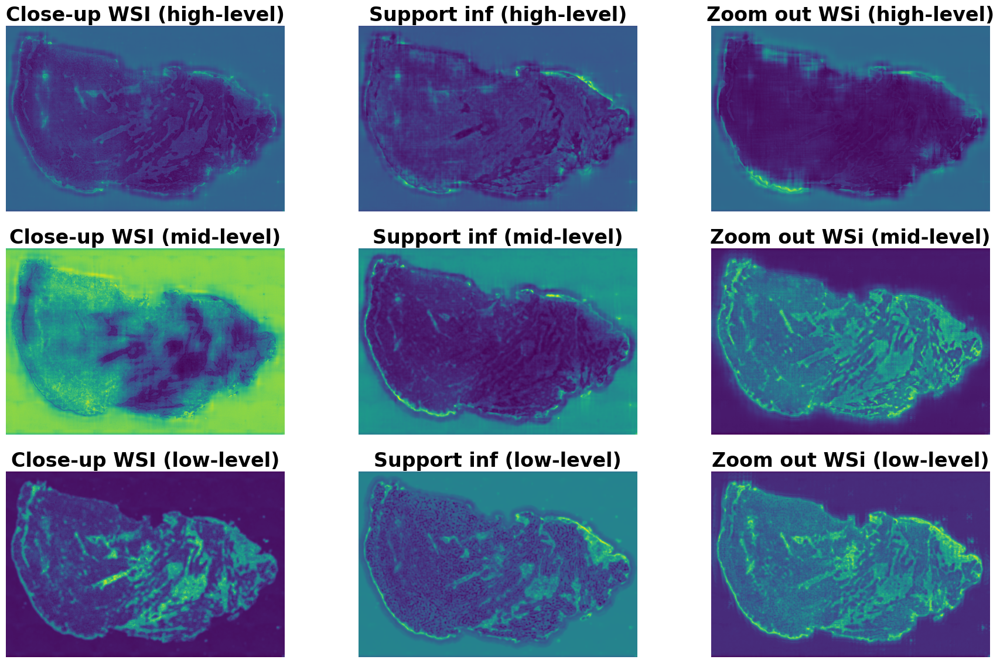

In [4]:
fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(22,14))


ax[0, 0].imshow(pred[3])
ax[0, 0].set_title("Close-up WSI (high-level)", fontsize=24, fontweight='bold')
ax[0, 0].axis('off')

ax[0, 1].imshow(pred[4])
ax[0, 1].set_title("Support inf (high-level)", fontsize=24, fontweight='bold')
ax[0, 1].axis('off')   
    
    
ax[0, 2].imshow(pred[5])
ax[0, 2].set_title("Zoom out WSi (high-level)", fontsize=24, fontweight='bold')
ax[0, 2].axis('off')


ax[1, 0].imshow(pred[9])
ax[1, 0].set_title("Close-up WSI (mid-level)", fontsize=24, fontweight='bold')
ax[1, 0].axis('off')

ax[1, 1].imshow(pred[10])
ax[1, 1].set_title("Support inf (mid-level)", fontsize=24, fontweight='bold')
ax[1, 1].axis('off')   
    
    
ax[1, 2].imshow(pred[11])
ax[1, 2].set_title("Zoom out WSi (mid-level)", fontsize=24, fontweight='bold')
ax[1, 2].axis('off')

ax[2, 0].imshow(pred[15])
ax[2, 0].set_title("Close-up WSI (low-level)", fontsize=24, fontweight='bold')
ax[2, 0].axis('off')

ax[2, 1].imshow(pred[16])
ax[2, 1].set_title("Support inf (low-level)", fontsize=24, fontweight='bold')
ax[2, 1].axis('off')   
    
    
ax[2, 2].imshow(pred[17])
ax[2, 2].set_title("Zoom out WSi (low-level)", fontsize=24, fontweight='bold')
ax[2, 2].axis('off')


plt.show()

### Encoder attention

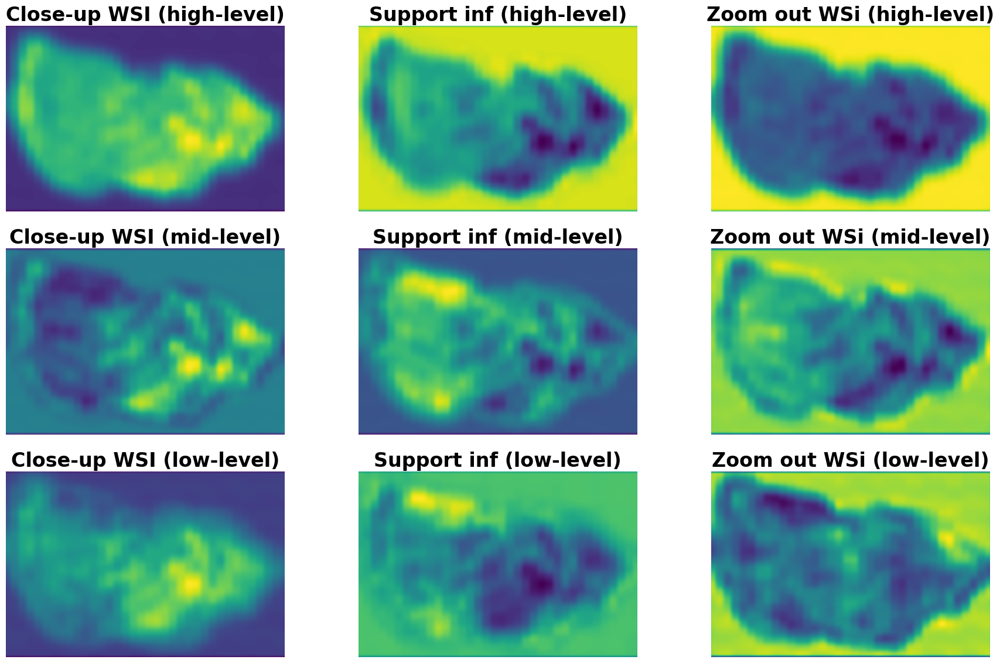

In [5]:
fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(22,14))


ax[0, 0].imshow(pred[0])
ax[0, 0].set_title("Close-up WSI (high-level)", fontsize=24, fontweight='bold')
ax[0, 0].axis('off')

ax[0, 1].imshow(pred[1])
ax[0, 1].set_title("Support inf (high-level)", fontsize=24, fontweight='bold')
ax[0, 1].axis('off')   
    
    
ax[0, 2].imshow(pred[2])
ax[0, 2].set_title("Zoom out WSi (high-level)", fontsize=24, fontweight='bold')
ax[0, 2].axis('off')


ax[1, 0].imshow(pred[6])
ax[1, 0].set_title("Close-up WSI (mid-level)", fontsize=24, fontweight='bold')
ax[1, 0].axis('off')

ax[1, 1].imshow(pred[7])
ax[1, 1].set_title("Support inf (mid-level)", fontsize=24, fontweight='bold')
ax[1, 1].axis('off')   
    
    
ax[1, 2].imshow(pred[8])
ax[1, 2].set_title("Zoom out WSi (mid-level)", fontsize=24, fontweight='bold')
ax[1, 2].axis('off')

ax[2, 0].imshow(pred[12])
ax[2, 0].set_title("Close-up WSI (low-level)", fontsize=24, fontweight='bold')
ax[2, 0].axis('off')

ax[2, 1].imshow(pred[13])
ax[2, 1].set_title("Support inf (low-level)", fontsize=24, fontweight='bold')
ax[2, 1].axis('off')   
    
    
ax[2, 2].imshow(pred[14])
ax[2, 2].set_title("Zoom out WSi (low-level)", fontsize=24, fontweight='bold')
ax[2, 2].axis('off')

plt.show()

### WSI prediction analysis

In [6]:
test_wsis = ['../output/7026_part_2.npy']
test_labels = ['../output/attention_model/7026_part_2_labels.npy' ]

mode = "binary"
downscaled = True

In [7]:
out = np.load(test_wsis[0])
labels = np.load(test_labels[0])
pred = np.load(f"../output/attention_model/7026_part_2.npy")

In [8]:
bg_mask = out[3]
bg_mask = cv2.resize(bg_mask, (bg_mask.shape[1]//2, bg_mask.shape[0]//2))
out = out[:3, :, :]
out = cv2.resize(out.transpose(1, 2, 0), (out.shape[2]//2, out.shape[1]//2)).transpose(2, 0, 1)
labels = cv2.resize(labels.astype(np.uint8).transpose(1, 2, 0), (labels.shape[2]//2, labels.shape[1]//2)).transpose(2, 0, 1)

In [9]:
%%capture
vis_img = out.copy()

# Postprocessing algorithm described in Section 6.3.3.2
for c_idx, thresh, area_thresh, color in zip([1, 2, 3], [0.15, 0.15, 0.5], [1000, 1000, 1500], [(0, 255, 0), (0, 0, 255), (255, 255, 0)]):

    contours, hierarchy = cv2.findContours((pred[c_idx]>=thresh).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    out_contours = []
    
    for c in contours:
        # print(cv2.contourArea(c))
        if cv2.contourArea(c) > area_thresh:
            out_contours.append(c)
            
    bg_contours, hierarchy = cv2.findContours(bg_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    areaArray = []
    for i, c in enumerate(bg_contours):
        area = cv2.contourArea(c)
        areaArray.append(area)

    sorteddata = sorted(zip(areaArray, bg_contours), key=lambda x: x[0], reverse=True)
    secondlargestcontour = sorteddata[1][1]

    if c_idx == 2:
        final_contours = []
        for c in out_contours:
            distance_list = []
            for pt in c:
                distance_list.append(np.abs(cv2.pointPolygonTest(secondlargestcontour, tuple([int(round(pt[0][0]) ), int(round( pt[0][1] )) ]),True)))
            if np.mean(distance_list) > 50:
                final_contours.append(c)
    else:
        final_contours = out_contours
    
    if c_idx == 1:
        vis_img = cv2.drawContours(np.ascontiguousarray(vis_img.transpose(1,2,0), dtype=np.uint8), final_contours, -1, color, 5)
    else:
        vis_img = cv2.drawContours(vis_img, final_contours, -1, color, 5)

#### Model prediction

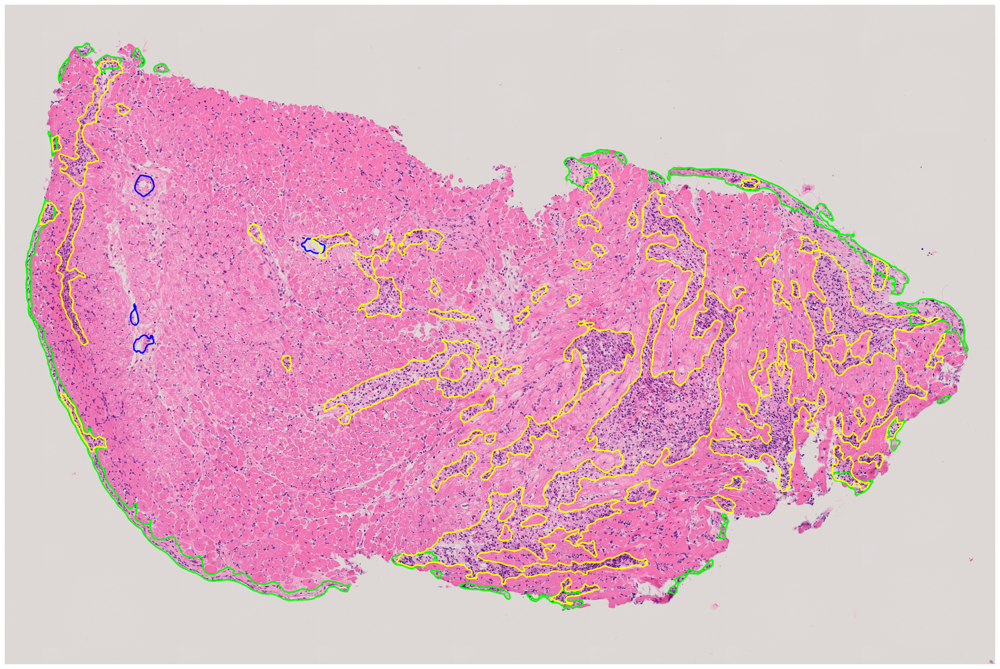

In [10]:
%matplotlib inline
plt.figure(figsize=(28,18))
plt.imshow(vis_img)
plt.axis('off')
plt.show()

#### Ground truth annotations

In [11]:
%%capture

for c_idx, color in zip([1, 2, 3], [(0, 255, 0), (0, 0, 255), (255, 255, 0)]):
    contours, hierarchy = cv2.findContours(labels[c_idx], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(np.transpose(out, (1, 2, 0)), contours, -1, color, 5)

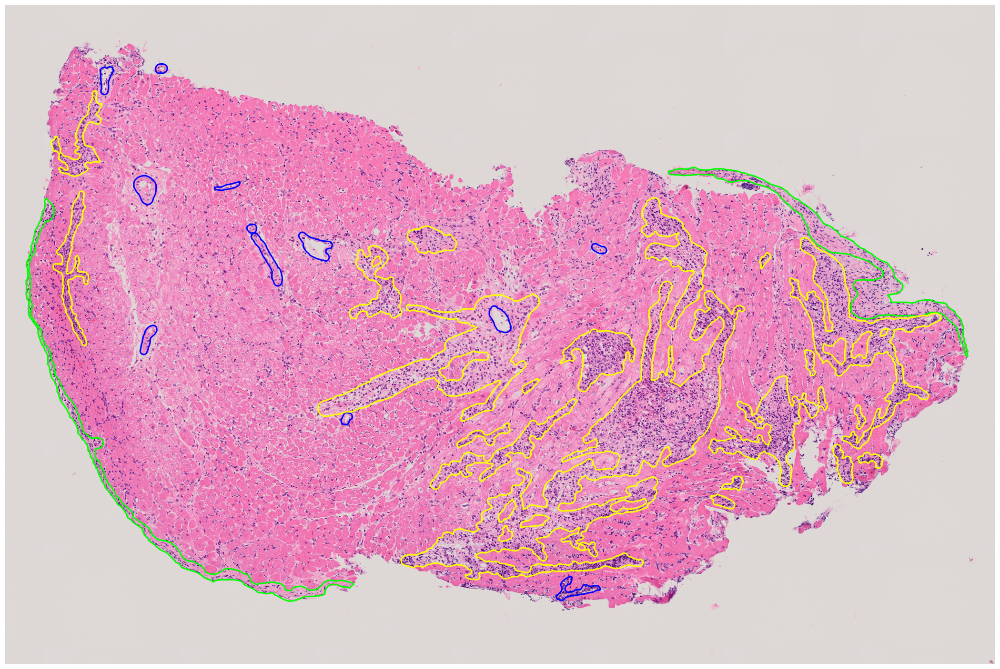

In [12]:
%matplotlib inline
plt.figure(figsize=(28,18))
plt.imshow(out.transpose(1, 2, 0))
plt.axis('off')
plt.show()

In [13]:
for c_idx, thresh, cname in zip([1, 2, 3], [0.15, 0.15, 0.5], ['Endocardium', 'Blood Vessels', 'Inflammation']):
    out_seg = pred[c_idx] > thresh
    out_labels = labels[c_idx]
    
    dice = np.sum(out_seg[out_labels==1])*2.0 / (np.sum(out_seg) + np.sum(out_labels))
    print(f"{cname} Dice: {dice}")

Endocardium Dice: 0.5656108200145694
Blood Vessels Dice: 0.2157554872795749
Inflammation Dice: 0.8141855672802921
